pystac-client 0.4 used due to depreciation issues

In [1]:
# pip install  pystac-client==0.4

In [2]:
# pip show pystac_client

In [3]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point, Polygon
from scipy.spatial import KDTree
import numpy as np

# Additional imports
import pystac_client
import xarray as xr
import pathlib
import os
import geopandas as gpd
import matplotlib as mpl
from matplotlib import colors
import rasterio

import cartopy.crs as ccrs
import cartopy
import plotly.graph_objects as go
import plotly.express as px
from rasterio.plot import show

import matplotlib.colors as mcolors
from shapely.geometry import Point
import pandas as pd

from tqdm import tqdm

import webbrowser
from pathlib import Path
import os
import time

from itertools import compress
import pandas as pd

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio

from tqdm import tqdm

from shapely.geometry import box



In [4]:
# opening STAC catalog

catalog = pystac_client.Client.open(
    "https://storage.googleapis.com/dgds-data-public/gca/SOTC/gca-stac_sotc/catalog.json" # cloud API
    # r"p:\1000545-054-globaltranectes\15_GlobalCoastalAtlas\coclicodata\current\catalog.json" # P drive API 
)
catalog


<Client id=gca-catalog>

In [5]:
list(catalog.get_collections())

[<CollectionClient id=shore_mon_fut>,
 <CollectionClient id=sed_class>,
 <CollectionClient id=shore_mon>,
 <CollectionClient id=world_pop>,
 <CollectionClient id=world_gdp>,
 <CollectionClient id=shore_mon_hr>,
 <CollectionClient id=shore_mon_drivers>,
 <CollectionClient id=esl_gwl>,
 <CollectionClient id=sub_threat>,
 <CollectionClient id=Exp_world_pop>,
 <CollectionClient id=Exp_world_pop_parquet>,
 <CollectionClient id=Haz-ESL>,
 <CollectionClient id=Vul-Inf_Mort>,
 <CollectionClient id=Haz-GCM_90-100>,
 <CollectionClient id=Exp-NS_Slopes>,
 <CollectionClient id=Vul_MYS>,
 <CollectionClient id=Vul_RS>,
 <CollectionClient id=Haz-GCM_40-50>,
 <CollectionClient id=Haz-ERA5_04-14>,
 <CollectionClient id=Vul-GDP_Cap>,
 <CollectionClient id=Haz-GCM_04-14>,
 <CollectionClient id=Haz-Land_Sub_2010_COGs>,
 <CollectionClient id=Haz-Land_Sub_2040_COGs>,
 <CollectionClient id=Vul-Roads_Density_COGs>,
 <CollectionClient id=Exp-Delta_DEM_COGs>]

In [6]:
collection= catalog.get_child("Haz-Land_Sub_2010_COGs")
collection

<CollectionClient id=Haz-Land_Sub_2010_COGs>

In [7]:
# items=list(collection.get_all_items())
# print(f"Number of items: {len(items)}")


In [8]:

# for item in items:
#     print(f"- {item.id}")

Test getting x-102.0_y-1

In [9]:
lon=-77.56
lat=+18.28
# B01_x12.0_y-70.0
item_name="B01_x-51.0_y50.0"
item=collection.get_item(item_name)
item

<Item id=B01_x-51.0_y50.0>

In [10]:
href=item.assets["band_data"].href
href

'https://storage.googleapis.com/dgds-data-public/gca/SOTC/Haz-Land_Sub_2010_COGs/B01_x-51.0_y50.0.tif'

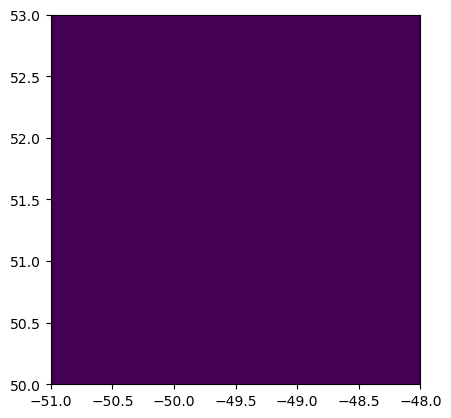

<Axes: >

In [11]:


img=rasterio.open(href)
# Plot the entire raster as an RGB image
show(img)

In [12]:
Land_sub = xr.open_dataset(
    href, engine="rasterio", mask_and_scale=False
)
Land_sub

<xarray.Dataset>
Dimensions:      (band: 1, x: 360, y: 360)
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 -51.0 -50.99 -50.98 -50.97 ... -48.02 -48.01 -48.0
  * y            (y) float64 53.0 52.99 52.98 52.97 ... 50.03 50.02 50.01 50.0
    spatial_ref  int32 ...
Data variables:
    band_data    (band, y, x) uint8 ...

In [13]:
def find_tile_name(latitude, longitude,sample_bottom_left_lon, sample_bottom_left_lat,tile_size):
    # Define the tile size in degrees (3 degrees in both latitude and longitude)
    offset_lon=sample_bottom_left_lon % tile_size
    offset_lat=sample_bottom_left_lat % tile_size

    
    # longitude=np.sign(longitude)*(abs(longitude)-abs(offset_lon))
    # latitude=np.sign(latitude)*(abs(latitude)-abs(offset_lat))
    
    # Calculate the bottom left corner coordinates of the tile positives only
    bottom_left_lon = (longitude // tile_size) * tile_size
    bottom_left_lat = (latitude // tile_size) * tile_size


    # If offset == 0 then perfect
    if offset_lat == 0:
         bottom_left_lat_final=bottom_left_lat
    if offset_lon == 0:
         bottom_left_lon_final=bottom_left_lon

    if offset_lat != 0 :
         bottom_left_lat_final=bottom_left_lat + offset_lat
         if bottom_left_lat_final > latitude:
              bottom_left_lat_final=bottom_left_lat_final-tile_size
    if offset_lon != 0 :
         bottom_left_lon_final=bottom_left_lon + offset_lon
         if bottom_left_lon_final > longitude:
              bottom_left_lon_final=bottom_left_lon_final-tile_size







    # Generate the tile name using the bottom left corner's coordinates
    tile_name = f"B01_x{bottom_left_lon_final:.1f}_y{bottom_left_lat_final:.1f}"

    return tile_name


In [14]:
# (-44.7//3)*3

In [15]:
import numpy as np
lon_x=178.4
lat_y=63.4

lon_x=-124.1
lat_y=78.17

lon_x=-70.5
lat_y=-14.4

lon_x=7.74
lat_y=-44.7

Sample_left_lon_x=-78
Sample_bottom_lat_y=14
tile_size=3

tile_name = find_tile_name(lat_y, lon_x,Sample_left_lon_x,Sample_bottom_lat_y,tile_size)
print(f"The point belongs to the tile: {tile_name}")

The point belongs to the tile: B01_x6.0_y-46.0


In [16]:

lon_x=-77.4253
lat_y= 17.8684

tile_name = find_tile_name(lat_y, lon_x,Sample_left_lon_x,Sample_bottom_lat_y,tile_size)
tile_name


'B01_x-78.0_y17.0'

In [17]:
(17//3)*3

15

In [18]:

href=collection.get_item(tile_name).assets["band_data"].href

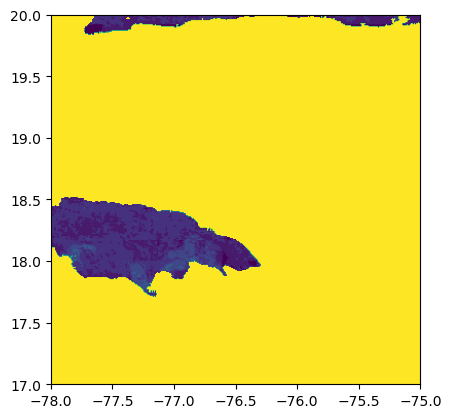

<Axes: >

In [19]:
Land_sub_img=rasterio.open(href)
# Plot the entire raster as an RGB image
show(Land_sub_img)


In [20]:

Land_sub_xr = xr.open_dataset(
    href, engine="rasterio", mask_and_scale=False
)
Land_sub_xr

<xarray.Dataset>
Dimensions:      (band: 1, x: 360, y: 360)
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 -78.0 -77.99 -77.98 -77.97 ... -75.02 -75.01 -75.0
  * y            (y) float64 20.0 19.99 19.98 19.97 ... 17.03 17.02 17.01 17.0
    spatial_ref  int32 ...
Data variables:
    band_data    (band, y, x) uint8 ...

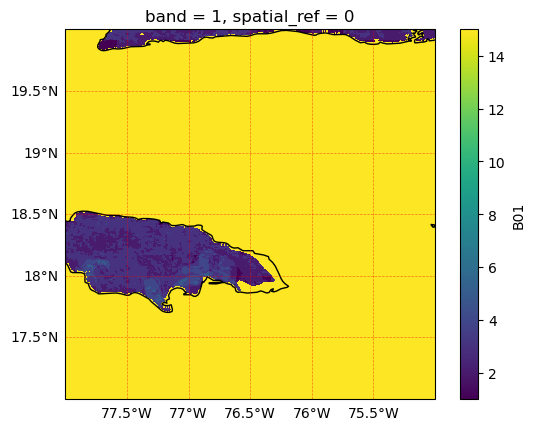

In [21]:
# Create a map projection
ax = plt.axes(projection=ccrs.PlateCarree())

# Plot the variable
Land_sub_xr["band_data"].plot(ax=ax, transform=ccrs.PlateCarree(), cmap='viridis')

# Add features like coastlines, borders, and ocean
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS, linestyle=':', edgecolor='black')
# ax.add_feature(cartopy.feature.OCEAN)

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.5, color='red', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False

# Set the title
# plt.title('Wave Height')

# Show the plot
plt.show()

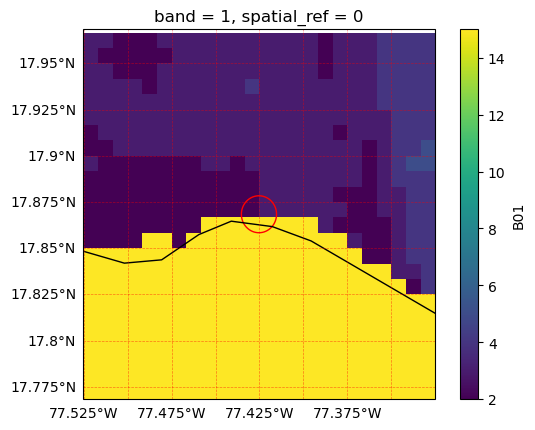

In [22]:
# Create a map projection
ax = plt.axes(projection=ccrs.PlateCarree())

# # Adjust these values to zoom in or out as needed
lon_min = lon_x -  0.1
lon_max = lon_x +  0.1
lat_min = lat_y +  0.1
lat_max = lat_y -  0.1
ax.set_extent([lon_min, lon_max, lat_min, lat_max])

# Plot the variable
Land_sub_xr["band_data"].sel(x=slice(lon_x-.1,lon_x+.1),y=slice(lat_y+.1,lat_y-.1)).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='viridis')

# Add features like coastlines, borders, and ocean
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS, linestyle=':', edgecolor='black')
# ax.add_feature(cartopy.feature.OCEAN)

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.5, color='red', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False

# Set the title
# plt.title('Wave Height')
# Define the point coordinates
lon_x = -77.4253
lat_y =  17.8684

# Create a point geometry
point = Point(lon_x, lat_y)

# Create a GeoDataFrame from the point
gdf = gpd.GeoDataFrame(geometry=[point])

# Add a  1000m buffer around the point
gdf['geometry'] = gdf['geometry'].buffer(.01)

# Define the projection
crs = "EPSG:4326"  # WGS84
gdf.set_crs(crs, inplace=True)

# Plot the GeoDataFrame
# fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()})
gdf.plot(ax=ax, color='none', edgecolor='red')
# Plot the variable


# Show the plot
plt.show()

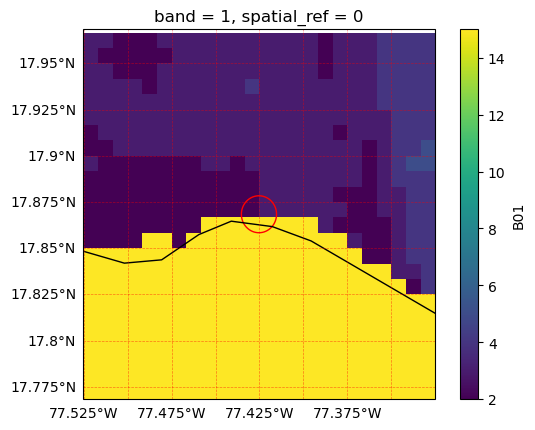

In [24]:
# Create a map projection
ax = plt.axes(projection=ccrs.PlateCarree())

# # Adjust these values to zoom in or out as needed
lon_min = lon_x -  0.1
lon_max = lon_x +  0.1
lat_min = lat_y +  0.1
lat_max = lat_y -  0.1
ax.set_extent([lon_min, lon_max, lat_min, lat_max])

# Plot the variable
Land_sub_xr["band_data"].sel(x=slice(lon_x-.1,lon_x+.1),y=slice(lat_y+.1,lat_y-.1)).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='viridis')

# Add features like coastlines, borders, and ocean
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS, linestyle=':', edgecolor='black')
# ax.add_feature(cartopy.feature.OCEAN)

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.5, color='red', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False

# Set the title
# plt.title('Wave Height')
# Define the point coordinates
lon_x = -77.4253
lat_y =  17.8684

# Create a point geometry
point = Point(lon_x, lat_y)

# Create a GeoDataFrame from the point
gdf = gpd.GeoDataFrame(geometry=[point])

# Add a  1000m buffer around the point
gdf['geometry'] = gdf['geometry'].buffer(.01)

# Define the projection
crs = "EPSG:4326"  # WGS84
gdf.set_crs(crs, inplace=True)


# Plot the GeoDataFrame
# fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()})
gdf.plot(ax=ax, color='none', edgecolor='red')
# buffer_circles_gdf.plot(ax=ax, color='none', edgecolor='red')
# Plot the variable


# Show the plot
plt.show()

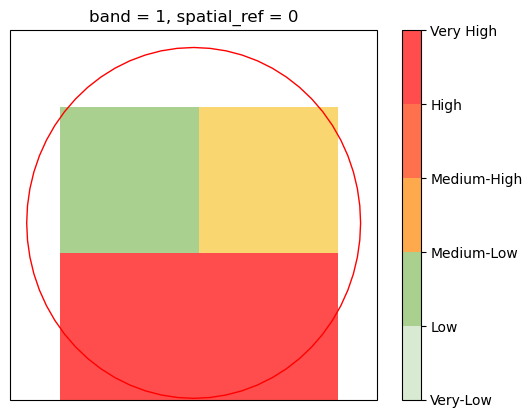

In [25]:
search_square=Land_sub_xr["band_data"].sel(x=slice(lon_x-.01,lon_x+.01),y=slice(lat_y+.01,lat_y-.01))



colors = ['#D9EAD3', '#A9D08E', '#F9D670', '#FFA94D', '#FF704D', '#FF4D4D']
risk_levels = ['Very-Low', 'Low', 'Medium-Low','Medium-High', 'High', 'Very High'] #very low, low, medium-low, medium-high, high and very high

cmap = mcolors.ListedColormap(colors)

# Create color bar
norm = mcolors.Normalize(vmin=1, vmax=6)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# Create a new Axes for the Colorbar
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})

cbar = fig.colorbar(sm, ticks=range(1, 7), ax=ax, boundaries=range(1, 7))
cbar.ax.set_yticklabels(risk_levels)

search_square.plot(ax=ax, cmap=cmap, vmin=1, vmax=6, add_colorbar=False)

point = Point(lon_x, lat_y)

# Create a GeoDataFrame from the point
gdf = gpd.GeoDataFrame(geometry=[point])

# Add a 1000m = 0.01degrees buffer around the point
gdf['geometry'] = gdf['geometry'].buffer(.01)

# Define the projection
crs = "EPSG:4326"  # WGS84
gdf.set_crs(crs, inplace=True)

gdf.plot(ax=ax, color='none', edgecolor='red')  # Create a point geometry

plt.show()

In [26]:
template_df=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\All_Datasets\Orig_Datasets\04_Auxillary_files\Arjen_Vector_Template.csv")
template_df.head()

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat
0,BOX_028_183_0,CHL,South America,Chile,-74.386310,-50.377659,-74.390966,-50.382558,-74.395623,-50.387456
1,BOX_028_183_1,CHL,South America,Chile,-74.382469,-50.379144,-74.387125,-50.384042,-74.391782,-50.388940
2,BOX_028_183_2,CHL,South America,Chile,-74.378628,-50.380629,-74.383284,-50.385527,-74.387941,-50.390425
3,BOX_028_183_3,CHL,South America,Chile,-74.373950,-50.382583,-74.379517,-50.387079,-74.385083,-50.391574
4,BOX_028_183_4,CHL,South America,Chile,-74.370425,-50.384358,-74.375991,-50.388853,-74.381558,-50.393348


In [27]:

circle_center_all = gpd.GeoDataFrame(
    template_df, geometry=gpd.points_from_xy(template_df.Intersect_lon, template_df.Intersect_lat), crs="EPSG:4326"
)
circle_center_all.head()

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,geometry
0,BOX_028_183_0,CHL,South America,Chile,-74.386310,-50.377659,-74.390966,-50.382558,-74.395623,-50.387456,POINT (-74.39097 -50.38256)
1,BOX_028_183_1,CHL,South America,Chile,-74.382469,-50.379144,-74.387125,-50.384042,-74.391782,-50.388940,POINT (-74.38713 -50.38404)
2,BOX_028_183_2,CHL,South America,Chile,-74.378628,-50.380629,-74.383284,-50.385527,-74.387941,-50.390425,POINT (-74.38328 -50.38553)
3,BOX_028_183_3,CHL,South America,Chile,-74.373950,-50.382583,-74.379517,-50.387079,-74.385083,-50.391574,POINT (-74.37952 -50.38708)
4,BOX_028_183_4,CHL,South America,Chile,-74.370425,-50.384358,-74.375991,-50.388853,-74.381558,-50.393348,POINT (-74.37599 -50.38885)


In [28]:
IPCC=gpd.read_file(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\All_Datasets\Orig_Datasets\04_Auxillary_files\IPCC-WGI-reference-regions-v4.gpkg")
IPCC.head()

,Continent,Type,Name,Acronym,geometry
0,POLAR,Land,Greenland/Iceland,GIC,"MULTIPOLYGON (((-10.00000 62.00000, -10.43750 ..."
1,NORTH-AMERICA,Land,N.W.North-America,NWN,"MULTIPOLYGON (((-105.00000 50.00000, -105.4386..."
2,NORTH-AMERICA,Land,N.E.North-America,NEN,"MULTIPOLYGON (((-50.00000 50.00000, -50.44000 ..."
3,NORTH-AMERICA,Land,W.North-America,WNA,"MULTIPOLYGON (((-130.00000 50.00000, -129.5614..."
4,NORTH-AMERICA,Land,C.North-America,CNA,"MULTIPOLYGON (((-90.00000 50.00000, -90.00000 ..."


In [29]:
region_acronym= "CAR"
region_gdf=IPCC.loc[IPCC["Acronym"]==region_acronym,:]
region_gdf


,Continent,Type,Name,Acronym,geometry
8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,"MULTIPOLYGON (((-75.00000 12.00000, -75.32609 ..."


In [30]:

# circle_center=region_gdf.sjoin(circle_center_all)
circle_center=circle_center_all.sjoin(region_gdf)
circle_center

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,geometry,index_right,Continent,Type,Name,Acronym
553337,BOX_116_353_2,COL,South America,Colombia,-71.874132,12.257491,-71.879805,12.250684,-71.885477,12.243877,POINT (-71.87980 12.25068),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
553338,BOX_116_353_3,COL,South America,Colombia,-71.869660,12.252394,-71.876981,12.247308,-71.884303,12.242222,POINT (-71.87698 12.24731),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
553339,BOX_116_353_4,COL,South America,Colombia,-71.866684,12.243923,-71.875632,12.243144,-71.884580,12.242366,POINT (-71.87563 12.24314),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
553340,BOX_116_353_5,COL,South America,Colombia,-71.866286,12.239551,-71.875233,12.238772,-71.884181,12.237993,POINT (-71.87523 12.23877),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
553341,BOX_116_353_6,COL,South America,Colombia,-71.865960,12.235759,-71.874835,12.234400,-71.883710,12.233041,POINT (-71.87483 12.23440),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
847873,BOX_139_002_61,DOM,North America,Dominican Republic,-71.660191,17.969154,-71.668186,17.965259,-71.676182,17.961363,POINT (-71.66819 17.96526),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
847874,BOX_139_002_62,DOM,North America,Dominican Republic,-71.657870,17.964549,-71.666228,17.961418,-71.674587,17.958286,POINT (-71.66623 17.96142),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
847875,BOX_139_002_63,DOM,North America,Dominican Republic,-71.656224,17.960573,-71.664583,17.957442,-71.672941,17.954311,POINT (-71.66458 17.95744),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
847876,BOX_139_002_64,DOM,North America,Dominican Republic,-71.654578,17.956598,-71.662937,17.953466,-71.671295,17.950335,POINT (-71.66294 17.95347),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR


In [31]:
template_df=circle_center
template_df["Tile_name"]="x"
template_df["Land_sub"]=np.nan
template_df.index=range(0,len(template_df.index))
template_df.head()

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,geometry,index_right,Continent,Type,Name,Acronym,Tile_name,Land_sub
0,BOX_116_353_2,COL,South America,Colombia,-71.874132,12.257491,-71.879805,12.250684,-71.885477,12.243877,POINT (-71.87980 12.25068),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,x,NaN
1,BOX_116_353_3,COL,South America,Colombia,-71.869660,12.252394,-71.876981,12.247308,-71.884303,12.242222,POINT (-71.87698 12.24731),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,x,NaN
2,BOX_116_353_4,COL,South America,Colombia,-71.866684,12.243923,-71.875632,12.243144,-71.884580,12.242366,POINT (-71.87563 12.24314),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,x,NaN
3,BOX_116_353_5,COL,South America,Colombia,-71.866286,12.239551,-71.875233,12.238772,-71.884181,12.237993,POINT (-71.87523 12.23877),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,x,NaN
4,BOX_116_353_6,COL,South America,Colombia,-71.865960,12.235759,-71.874835,12.234400,-71.883710,12.233041,POINT (-71.87483 12.23440),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,x,NaN


In [34]:
import utm
check_distance_m=2000#1000m buffer radius
buffer_circles=[]
# buffer_circles = gpd.GeoDataFrame([Polygon(p.buffer(check_distance)) for p in circle_center[0][:5]])
for index,transect in tqdm(template_df.iterrows(),desc="buffer_circles created"):
    
    lon1=transect.Intersect_lon
    lat1=transect.Intersect_lat


    utm_zone = utm.from_latlon(lat1, lon1)
    utm_zone
    transform = f"EPSG:326{utm_zone[2]}"

    # Transform beach coordinates to UTM
    transect_utm = gpd.GeoDataFrame({'geometry': [Point(lon1, lat1)]}, crs="EPSG:4326")
    transect_utm =transect_utm.to_crs(transform)

    # Create buffer circle
    buffer_geom = transect_utm.buffer(check_distance_m).geometry.iloc[0]
    buffer_circle = gpd.GeoDataFrame({'geometry': [buffer_geom]}, crs=transform)

    buffer_circle = buffer_circle.to_crs("EPSG:4326")
    buffer_circle["Intersect_lat"]=lat1
    buffer_circle["Intersect_lon"]=lon1

    buffer_circles.append(buffer_circle)


buffer_circles

buffer_circles created: 37509it [10:13, 61.13it/s]


[                                            geometry  Intersect_lat  \
 0  POLYGON ((-71.86144 12.25088, -71.86151 12.249...      12.250684   
 
    Intersect_lon  
 0     -71.879805  ,
                                             geometry  Intersect_lat  \
 0  POLYGON ((-71.85862 12.24750, -71.85868 12.245...      12.247308   
 
    Intersect_lon  
 0     -71.876981  ,
                                             geometry  Intersect_lat  \
 0  POLYGON ((-71.85727 12.24334, -71.85734 12.241...      12.243144   
 
    Intersect_lon  
 0     -71.875632  ,
                                             geometry  Intersect_lat  \
 0  POLYGON ((-71.85687 12.23896, -71.85694 12.237...      12.238772   
 
    Intersect_lon  
 0     -71.875233  ,
                                             geometry  Intersect_lat  \
 0  POLYGON ((-71.85647 12.23459, -71.85654 12.232...        12.2344   
 
    Intersect_lon  
 0     -71.874835  ,
                                             geometry  Intersect_

In [35]:
buffer_circles_gdf = pd.concat([pd.DataFrame(circle) for circle in buffer_circles], ignore_index=True)
buffer_circles_gdf

,geometry,Intersect_lat,Intersect_lon
0,"POLYGON ((-71.86144 12.25088, -71.86151 12.249...",12.250684,-71.879805
1,"POLYGON ((-71.85862 12.24750, -71.85868 12.245...",12.247308,-71.876981
2,"POLYGON ((-71.85727 12.24334, -71.85734 12.241...",12.243144,-71.875632
3,"POLYGON ((-71.85687 12.23896, -71.85694 12.237...",12.238772,-71.875233
4,"POLYGON ((-71.85647 12.23459, -71.85654 12.232...",12.234400,-71.874835
...,...,...,...
37504,"POLYGON ((-71.64932 17.96552, -71.64938 17.963...",17.965259,-71.668186
37505,"POLYGON ((-71.64736 17.96168, -71.64742 17.959...",17.961418,-71.666228
37506,"POLYGON ((-71.64572 17.95770, -71.64578 17.955...",17.957442,-71.664583
37507,"POLYGON ((-71.64407 17.95372, -71.64413 17.951...",17.953466,-71.662937


In [36]:
buffer_circles_gdf['geometry'] = buffer_circles_gdf['geometry'].apply(Polygon)
buffer_circles_gdf = gpd.GeoDataFrame(buffer_circles_gdf, geometry='geometry')
buffer_circles_gdf

,geometry,Intersect_lat,Intersect_lon
0,"POLYGON ((-71.86144 12.25088, -71.86151 12.249...",12.250684,-71.879805
1,"POLYGON ((-71.85862 12.24750, -71.85868 12.245...",12.247308,-71.876981
2,"POLYGON ((-71.85727 12.24334, -71.85734 12.241...",12.243144,-71.875632
3,"POLYGON ((-71.85687 12.23896, -71.85694 12.237...",12.238772,-71.875233
4,"POLYGON ((-71.85647 12.23459, -71.85654 12.232...",12.234400,-71.874835
...,...,...,...
37504,"POLYGON ((-71.64932 17.96552, -71.64938 17.963...",17.965259,-71.668186
37505,"POLYGON ((-71.64736 17.96168, -71.64742 17.959...",17.961418,-71.666228
37506,"POLYGON ((-71.64572 17.95770, -71.64578 17.955...",17.957442,-71.664583
37507,"POLYGON ((-71.64407 17.95372, -71.64413 17.951...",17.953466,-71.662937


<Axes: >

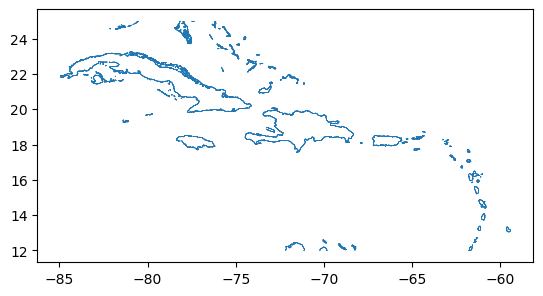

In [37]:
buffer_circles_gdf.plot()

In [38]:
buffer_circles_gdf.to_file("Caribbean_buffer_circles_2km.gpkg", driver="GPKG")

In [39]:
buffer_circles_gdf = gpd.read_file("Caribbean_buffer_circles_2km.gpkg")
buffer_circles_gdf

,Intersect_lat,Intersect_lon,geometry
0,12.250684,-71.879805,"POLYGON ((-71.86144 12.25088, -71.86151 12.249..."
1,12.247308,-71.876981,"POLYGON ((-71.85862 12.24750, -71.85868 12.245..."
2,12.243144,-71.875632,"POLYGON ((-71.85727 12.24334, -71.85734 12.241..."
3,12.238772,-71.875233,"POLYGON ((-71.85687 12.23896, -71.85694 12.237..."
4,12.234400,-71.874835,"POLYGON ((-71.85647 12.23459, -71.85654 12.232..."
...,...,...,...
37504,17.965259,-71.668186,"POLYGON ((-71.64932 17.96552, -71.64938 17.963..."
37505,17.961418,-71.666228,"POLYGON ((-71.64736 17.96168, -71.64742 17.959..."
37506,17.957442,-71.664583,"POLYGON ((-71.64572 17.95770, -71.64578 17.955..."
37507,17.953466,-71.662937,"POLYGON ((-71.64407 17.95372, -71.64413 17.951..."


In [40]:
# Get the bounding box of the buffer circle
bbox = buffer_circles_gdf.iloc[0:1,:].total_bounds

# Extract the extents
minx, miny, maxx, maxy = bbox
bbox

array([-71.89817062,  12.23262024, -71.86143827,  12.26874717])

In [37]:
# Get the bounding box of the buffer circle
bbox = buffer_circles_gdf.iloc[0:1,:].total_bounds

# Extract the extents
minx, miny, maxx, maxy = bbox
bbox

array([-71.88898765,  12.24165198, -71.87062147,  12.25971545])

In [41]:
template_df

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,geometry,index_right,Continent,Type,Name,Acronym,Tile_name,Land_sub
0,BOX_116_353_2,COL,South America,Colombia,-71.874132,12.257491,-71.879805,12.250684,-71.885477,12.243877,POINT (-71.87980 12.25068),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,x,NaN
1,BOX_116_353_3,COL,South America,Colombia,-71.869660,12.252394,-71.876981,12.247308,-71.884303,12.242222,POINT (-71.87698 12.24731),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,x,NaN
2,BOX_116_353_4,COL,South America,Colombia,-71.866684,12.243923,-71.875632,12.243144,-71.884580,12.242366,POINT (-71.87563 12.24314),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,x,NaN
3,BOX_116_353_5,COL,South America,Colombia,-71.866286,12.239551,-71.875233,12.238772,-71.884181,12.237993,POINT (-71.87523 12.23877),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,x,NaN
4,BOX_116_353_6,COL,South America,Colombia,-71.865960,12.235759,-71.874835,12.234400,-71.883710,12.233041,POINT (-71.87483 12.23440),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,x,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37504,BOX_139_002_61,DOM,North America,Dominican Republic,-71.660191,17.969154,-71.668186,17.965259,-71.676182,17.961363,POINT (-71.66819 17.96526),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,x,NaN
37505,BOX_139_002_62,DOM,North America,Dominican Republic,-71.657870,17.964549,-71.666228,17.961418,-71.674587,17.958286,POINT (-71.66623 17.96142),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,x,NaN
37506,BOX_139_002_63,DOM,North America,Dominican Republic,-71.656224,17.960573,-71.664583,17.957442,-71.672941,17.954311,POINT (-71.66458 17.95744),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,x,NaN
37507,BOX_139_002_64,DOM,North America,Dominican Republic,-71.654578,17.956598,-71.662937,17.953466,-71.671295,17.950335,POINT (-71.66294 17.95347),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,x,NaN


In [42]:


Sample_left_lon_x=-78
Sample_bottom_lat_y=14
tile_size=3
nodata_val=15
# search_radius=0.01 #Degress=1000m

# tile_name_check=[]
# for i in tqdm(range(len(template_df["Land_sub"]))[0:3],desc="row number"):
for i in tqdm(range(len(template_df["Land_sub"])),desc="Giving tile names"):
    lon_x=template_df.iloc[i,6]
    lat_y=template_df.iloc[i,7]

        # Get the bounding box of the buffer circle
    




    tile_name = find_tile_name(lat_y, lon_x,Sample_left_lon_x,Sample_bottom_lat_y,tile_size)
    # tile_name

  
    template_df.iloc[i,-2]=tile_name
    # tile_name_check=tile_name
template_df



Giving tile names: 100%|██████████| 37509/37509 [00:05<00:00, 7243.92it/s]


,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,geometry,index_right,Continent,Type,Name,Acronym,Tile_name,Land_sub
0,BOX_116_353_2,COL,South America,Colombia,-71.874132,12.257491,-71.879805,12.250684,-71.885477,12.243877,POINT (-71.87980 12.25068),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-72.0_y11.0,NaN
1,BOX_116_353_3,COL,South America,Colombia,-71.869660,12.252394,-71.876981,12.247308,-71.884303,12.242222,POINT (-71.87698 12.24731),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-72.0_y11.0,NaN
2,BOX_116_353_4,COL,South America,Colombia,-71.866684,12.243923,-71.875632,12.243144,-71.884580,12.242366,POINT (-71.87563 12.24314),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-72.0_y11.0,NaN
3,BOX_116_353_5,COL,South America,Colombia,-71.866286,12.239551,-71.875233,12.238772,-71.884181,12.237993,POINT (-71.87523 12.23877),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-72.0_y11.0,NaN
4,BOX_116_353_6,COL,South America,Colombia,-71.865960,12.235759,-71.874835,12.234400,-71.883710,12.233041,POINT (-71.87483 12.23440),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-72.0_y11.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37504,BOX_139_002_61,DOM,North America,Dominican Republic,-71.660191,17.969154,-71.668186,17.965259,-71.676182,17.961363,POINT (-71.66819 17.96526),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-72.0_y17.0,NaN
37505,BOX_139_002_62,DOM,North America,Dominican Republic,-71.657870,17.964549,-71.666228,17.961418,-71.674587,17.958286,POINT (-71.66623 17.96142),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-72.0_y17.0,NaN
37506,BOX_139_002_63,DOM,North America,Dominican Republic,-71.656224,17.960573,-71.664583,17.957442,-71.672941,17.954311,POINT (-71.66458 17.95744),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-72.0_y17.0,NaN
37507,BOX_139_002_64,DOM,North America,Dominican Republic,-71.654578,17.956598,-71.662937,17.953466,-71.671295,17.950335,POINT (-71.66294 17.95347),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-72.0_y17.0,NaN


In [43]:
#Sort by tile name to speed up computation
sorted_template_df = template_df.sort_values(by='Tile_name', ascending=True)
sorted_template_df

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,geometry,index_right,Continent,Type,Name,Acronym,Tile_name,Land_sub
3746,BOX_117_218_83,BRB,North America,Barbados,-59.579018,13.283934,-59.570669,13.287160,-59.562319,13.290386,POINT (-59.57067 13.28716),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
3752,BOX_117_218_89,BRB,North America,Barbados,-59.590879,13.304903,-59.583584,13.310003,-59.576288,13.315104,POINT (-59.58358 13.31000),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
3751,BOX_117_218_88,BRB,North America,Barbados,-59.588258,13.301353,-59.580963,13.306454,-59.573667,13.311554,POINT (-59.58096 13.30645),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
3750,BOX_117_218_87,BRB,North America,Barbados,-59.585637,13.297803,-59.578342,13.302904,-59.571047,13.308005,POINT (-59.57834 13.30290),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
3749,BOX_117_218_86,BRB,North America,Barbados,-59.583859,13.294961,-59.575994,13.299186,-59.568130,13.303411,POINT (-59.57599 13.29919),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25815,BOX_138_080_23,CUB,North America,Cuba,-84.330784,22.112429,-84.339724,22.113245,-84.348664,22.114062,POINT (-84.33972 22.11325),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,NaN
25814,BOX_138_080_22,CUB,North America,Cuba,-84.330359,22.118191,-84.339300,22.117387,-84.348241,22.116583,POINT (-84.33930 22.11739),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,NaN
25813,BOX_138_080_21,CUB,North America,Cuba,-84.331355,22.124170,-84.339864,22.121502,-84.348373,22.118834,POINT (-84.33986 22.12150),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,NaN
25825,BOX_138_080_33,CUB,North America,Cuba,-84.326943,22.093661,-84.330312,22.085945,-84.333681,22.078228,POINT (-84.33031 22.08594),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,NaN


In [44]:
sorted_template_df.index

Index([ 3746,  3752,  3751,  3750,  3749,  3748,  3747,  3745,  3744,  3743,
       ...
       25820, 25819, 25818, 25817, 25816, 25815, 25814, 25813, 25825, 19501],
      dtype='int64', length=37509)

In [45]:
template_df=sorted_template_df

template_df

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,geometry,index_right,Continent,Type,Name,Acronym,Tile_name,Land_sub
3746,BOX_117_218_83,BRB,North America,Barbados,-59.579018,13.283934,-59.570669,13.287160,-59.562319,13.290386,POINT (-59.57067 13.28716),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
3752,BOX_117_218_89,BRB,North America,Barbados,-59.590879,13.304903,-59.583584,13.310003,-59.576288,13.315104,POINT (-59.58358 13.31000),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
3751,BOX_117_218_88,BRB,North America,Barbados,-59.588258,13.301353,-59.580963,13.306454,-59.573667,13.311554,POINT (-59.58096 13.30645),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
3750,BOX_117_218_87,BRB,North America,Barbados,-59.585637,13.297803,-59.578342,13.302904,-59.571047,13.308005,POINT (-59.57834 13.30290),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
3749,BOX_117_218_86,BRB,North America,Barbados,-59.583859,13.294961,-59.575994,13.299186,-59.568130,13.303411,POINT (-59.57599 13.29919),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25815,BOX_138_080_23,CUB,North America,Cuba,-84.330784,22.112429,-84.339724,22.113245,-84.348664,22.114062,POINT (-84.33972 22.11325),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,NaN
25814,BOX_138_080_22,CUB,North America,Cuba,-84.330359,22.118191,-84.339300,22.117387,-84.348241,22.116583,POINT (-84.33930 22.11739),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,NaN
25813,BOX_138_080_21,CUB,North America,Cuba,-84.331355,22.124170,-84.339864,22.121502,-84.348373,22.118834,POINT (-84.33986 22.12150),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,NaN
25825,BOX_138_080_33,CUB,North America,Cuba,-84.326943,22.093661,-84.330312,22.085945,-84.333681,22.078228,POINT (-84.33031 22.08594),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,NaN


In [70]:
# i=19153
template_df.loc[template_df.index==i,:]

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,geometry,index_right,Continent,Type,Name,Acronym,Tile_name,Land_sub
19501,BOX_138_091_96,CUB,North America,Cuba,-84.19866,22.524415,-84.20761,22.525122,-84.216561,22.525829,POINT (-84.20761 22.52512),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,2.0


In [71]:
buffer_circles_gdf.loc[buffer_circles_gdf.index==i,:]

,Intersect_lat,Intersect_lon,geometry
19501,22.525122,-84.20761,"POLYGON ((-84.18819 22.52478, -84.18831 22.523..."


In [72]:
buffer_circles_gdf.iloc[i:i+1,:]

,Intersect_lat,Intersect_lon,geometry
19501,22.525122,-84.20761,"POLYGON ((-84.18819 22.52478, -84.18831 22.523..."


In [73]:
template_df.iloc[i:i+1,:]

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,geometry,index_right,Continent,Type,Name,Acronym,Tile_name,Land_sub
11355,BOX_138_214_97,CUB,North America,Cuba,-77.172754,21.462637,-77.179565,21.468088,-77.186377,21.473538,POINT (-77.17957 21.46809),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-78.0_y20.0,2.0


In [74]:
template_df.loc[template_df.index==i,"Intersect_lon"].values[0]+0

-84.20761007760001

In [106]:



Sample_left_lon_x=-78
Sample_bottom_lat_y=14
tile_size=3
nodata_val=15
# search_radius=0.01 #Degress=1000m

tile_name_check="x"
# for i in tqdm(range(len(template_df["Land_sub"]))[0:3],desc="row number"):
for i in tqdm(template_df.index,desc="row number"):
    lon_x=template_df.loc[template_df.index==i,"Intersect_lon"].values[0]+0
    lat_y=template_df.loc[template_df.index==i,"Intersect_lat"].values[0]+0

        # Get the bounding box of the buffer circle
    
    if i +1 < len(template_df["Land_sub"]):
        bbox = buffer_circles_gdf.iloc[i:i+1,:].total_bounds
    else:
        bbox = buffer_circles_gdf.iloc[-1:,:].total_bounds

    # Extract the extents
    minx, miny, maxx, maxy = bbox



    tile_name = find_tile_name(lat_y, lon_x,Sample_left_lon_x,Sample_bottom_lat_y,tile_size)
    # tile_name


    #avoid unnecessary href calling if the transect is already in the same tile
    if tile_name!=tile_name_check:

        href=collection.get_item(tile_name).assets["band_data"].href
        Land_sub_xr = xr.open_dataset(
            href, engine="rasterio", mask_and_scale=False
        )
    
    tile_name_check=tile_name
    search_square=Land_sub_xr["band_data"].sel(x=slice(minx,maxx),y=slice(maxy,miny))



    search_square.values = np.where(search_square.values != nodata_val, search_square.values, np.nan)

    # Check if there are any non-NaN values in the array
    if np.isnan(search_square.values).all():
        continue
    else:
        # Compute the mean of non-NaN values and take the ceiling
        transect_land_sub_risk = np.ceil(np.nanmean(search_square.values))
    template_df.loc[template_df.index==i,"Land_sub"]=transect_land_sub_risk
    
template_df



row number: 100%|██████████| 37509/37509 [02:24<00:00, 260.38it/s]


,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,geometry,index_right,Continent,Type,Name,Acronym,Tile_name,Land_sub
3746,BOX_117_218_83,BRB,North America,Barbados,-59.579018,13.283934,-59.570669,13.287160,-59.562319,13.290386,POINT (-59.57067 13.28716),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
3752,BOX_117_218_89,BRB,North America,Barbados,-59.590879,13.304903,-59.583584,13.310003,-59.576288,13.315104,POINT (-59.58358 13.31000),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
3751,BOX_117_218_88,BRB,North America,Barbados,-59.588258,13.301353,-59.580963,13.306454,-59.573667,13.311554,POINT (-59.58096 13.30645),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
3750,BOX_117_218_87,BRB,North America,Barbados,-59.585637,13.297803,-59.578342,13.302904,-59.571047,13.308005,POINT (-59.57834 13.30290),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
3749,BOX_117_218_86,BRB,North America,Barbados,-59.583859,13.294961,-59.575994,13.299186,-59.568130,13.303411,POINT (-59.57599 13.29919),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25815,BOX_138_080_23,CUB,North America,Cuba,-84.330784,22.112429,-84.339724,22.113245,-84.348664,22.114062,POINT (-84.33972 22.11325),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,4.0
25814,BOX_138_080_22,CUB,North America,Cuba,-84.330359,22.118191,-84.339300,22.117387,-84.348241,22.116583,POINT (-84.33930 22.11739),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,4.0
25813,BOX_138_080_21,CUB,North America,Cuba,-84.331355,22.124170,-84.339864,22.121502,-84.348373,22.118834,POINT (-84.33986 22.12150),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,4.0
25825,BOX_138_080_33,CUB,North America,Cuba,-84.326943,22.093661,-84.330312,22.085945,-84.333681,22.078228,POINT (-84.33031 22.08594),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,4.0


In [107]:
template_df.to_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Land_Subsidence\caribbean_land_sub_2km.csv",index=False)

In [108]:
template_df.iloc[:,-1].describe()

count    17521.000000
mean         2.391930
std          0.857402
min          1.000000
25%          2.000000
50%          2.000000
75%          3.000000
max          5.000000
Name: Land_sub, dtype: float64

In [109]:
df=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Land_Subsidence\caribbean_land_sub_2km.csv")
df

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,geometry,index_right,Continent,Type,Name,Acronym,Tile_name,Land_sub
0,BOX_117_218_83,BRB,North America,Barbados,-59.579018,13.283934,-59.570669,13.287160,-59.562319,13.290386,POINT (-59.570668594 13.287160169200002),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
1,BOX_117_218_89,BRB,North America,Barbados,-59.590879,13.304903,-59.583584,13.310003,-59.576288,13.315104,POINT (-59.5835835235 13.3100033568),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
2,BOX_117_218_88,BRB,North America,Barbados,-59.588258,13.301353,-59.580963,13.306454,-59.573667,13.311554,POINT (-59.580962738500006 13.306453608800002),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
3,BOX_117_218_87,BRB,North America,Barbados,-59.585637,13.297803,-59.578342,13.302904,-59.571047,13.308005,POINT (-59.5783419282 13.3029038266),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
4,BOX_117_218_86,BRB,North America,Barbados,-59.583859,13.294961,-59.575994,13.299186,-59.568130,13.303411,POINT (-59.5759942982 13.2991859517),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37504,BOX_138_080_23,CUB,North America,Cuba,-84.330784,22.112429,-84.339724,22.113245,-84.348664,22.114062,POINT (-84.3397237149 22.1132454928),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,4.0
37505,BOX_138_080_22,CUB,North America,Cuba,-84.330359,22.118191,-84.339300,22.117387,-84.348241,22.116583,POINT (-84.3393001379 22.11738655),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,4.0
37506,BOX_138_080_21,CUB,North America,Cuba,-84.331355,22.124170,-84.339864,22.121502,-84.348373,22.118834,POINT (-84.3398642743 22.1215021563),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,4.0
37507,BOX_138_080_33,CUB,North America,Cuba,-84.326943,22.093661,-84.330312,22.085945,-84.333681,22.078228,POINT (-84.3303119326 22.085944550700003),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,4.0


In [110]:
import plotly.graph_objects as go

# Define your discrete color scale
color_scale = ['#D9EAD3', '#A9D08E', '#F9D670', '#FFA94D', '#FF704D', '#FF4D4D']

# Create the scatter mapbox plot using Plotly Graph Objects
fig2 = go.Figure(go.Scattermapbox(
    lat=df['Intersect_lat'],
    lon=df['Intersect_lon'],
    mode='markers',
    marker=dict(
        size=10,
        color=df['Land_sub'],  # Use the 'Land_sub' column for color
        colorscale=color_scale,  # Specify the discrete color scale
        cmin=1,  # Set the minimum value for the color scale
        cmax=6,  # Set the maximum value for the color scale
        colorbar=dict(
            title='Land Subsidence risk'  # Set color bar title
        )
    ),
    hoverinfo='text',
    hovertext=df['geometry']
))

# Update layout properties
fig2.update_layout(
    title="Land Subsidence Map in Jamaica",
    mapbox_style="carto-positron",
    mapbox=dict(
        zoom=8,
        center=dict(lat=18.1, lon=-77.3)
    ),
    margin=dict(l=0, r=0, b=0, t=0),
)

# Show the plot
fig2.show()
